In [ ]:
!pip install pymc
!pip install pytensor
!pip install arviz
!pip install astropy
!pip install corner

### Likelihood definition

$$
L_i = \iiiint dD_L \, dM_{z} \, d\tilde{\Lambda} \, dq \cdot P(D_L^{obs}, M_{z}^{obs}, q^{obs}, \tilde{\Lambda}^{obs} \mid D_L, M_{z}, q, \tilde{\Lambda}) \cdot P(D_L, M_{z}, q, \tilde{\Lambda} \mid Cos, Pop_1, Pop_2, Eos)
$$

### Total likelihood

$$
L = \prod_i \sum_{z_j} \sum_{q_k}
\mathcal{N}(D_L^{obs} \mid D_{L_i}) \,
\frac{1}{1+z_j} \,
\mathcal{N}\!\left(\frac{M_{z_i}}{1+z_j} \mid \mu_p, \sigma_p\right) \,
\mathcal{N}(q^{obs} \mid q_k) \,
\mathcal{N}\!\left(\tilde{\Lambda}^{obs} \mid \tilde{\Lambda}\!\left(\frac{M_{z_i}}{1+z_j}, q_k, Eos\right)\right)
$$

### Testing the math for 100 observations

Using optimal z_pivot = 0.5131211941689238


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H_pivot  0.876  0.046   0.797    0.968      0.006    0.006      48.0   
H0       0.752  0.113   0.555    0.981      0.014    0.014      63.0   
Om       0.266  0.064   0.141    0.381      0.008    0.007      66.0   
w       -1.347  0.312  -1.950   -0.862      0.015    0.023     620.0   
mu_p     1.177  0.031   1.114    1.227      0.004    0.004      47.0   
sigma_p  0.100  0.008   0.086    0.114      0.000    0.000     388.0   
c0       4.812  0.051   4.717    4.907      0.001    0.001    5594.0   
c1      -5.063  0.146  -5.357   -4.806      0.019    0.015      57.0   
mu_q     0.483  0.011   0.461    0.504      0.000    0.000    9857.0   
sigma_q  0.103  0.009   0.086    0.120      0.000    0.000    6280.0   

         ess_tail  r_hat  
H_pivot      96.0   1.07  
H0           98.0   1.05  
Om          143.0   1.05  
w           342.0   1.01  
mu_p         88.0   1.07  
sigma_p    2072.0   1.01  
c0         5345.0 

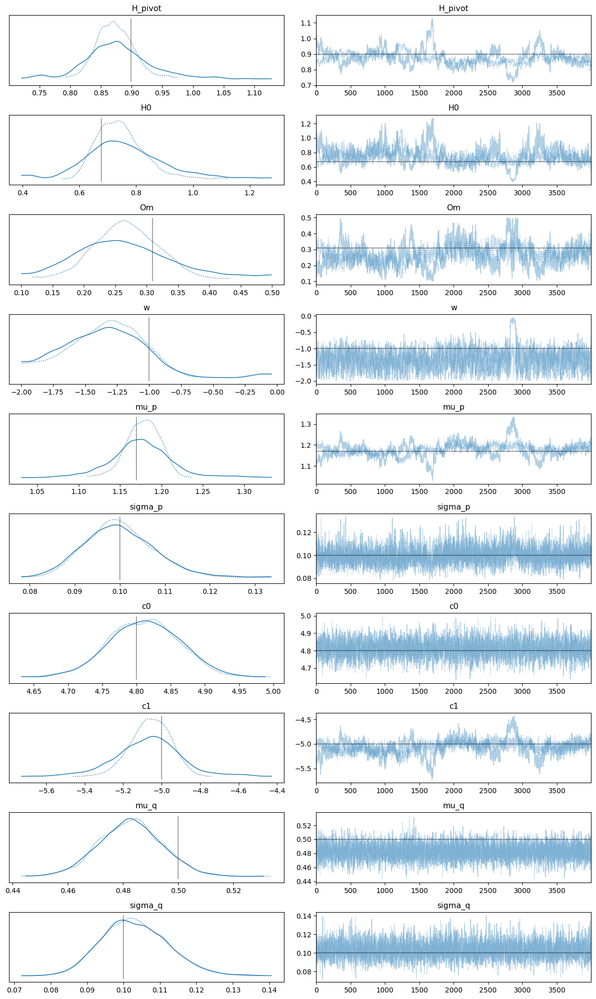

In [ ]:
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u

# --- Functions ---
def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om * opz ** (3 * (1 + wDM)) + (1 - Om) * opz ** (3 * (1 + w)))

def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

# --- Pivot optimization helper ---
def fracHz(z, Om=0.3, w=-1.0):
    """Proxy for fractional uncertainty σH/H from log-derivatives wrt parameters."""
    opz = 1 + z
    denom = Om + (1 - Om) * opz ** (3*w)
    num_Om = 1 - opz ** (3*w)
    num_w  = (1 - Om) * 3 * opz ** (3*w) * np.log(opz)
    return np.sqrt(num_Om**2 + num_w**2) / (2 * denom)

# --- Mock data ---
Nobs = 100
z_true = np.random.beta(3, 9, Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Gpc).value
sigma_DL = 0.07
DL_obs = np.random.normal(DL_true, sigma_DL)

# True chirp mass distribution
mu_p_true = 1.17
sigma_p_true = 0.1
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true

# --- Mass ratio (q) ---
mu_q_true = 0.5
sigma_q_true = 0.1
# Generate in [0,1]
q_true = np.clip(np.random.normal(mu_q_true, sigma_q_true, size=Nobs), 1e-4, 1-1e-4)

# Measurement noise
sigma_q_obs = 0.05
q_obs = np.clip(np.random.normal(q_true, sigma_q_obs), 1e-4, 1-1e-4)

# --- Tidal deformabilities ---
c0_true = 4.8
c1_true = -5.0
Lambda_true = c0_true + c1_true * ((M_source_true - mu_p_true) / 1.0)
sigma_lambda = 0.07
Lambda_obs = np.random.normal(Lambda_true, sigma_lambda)

# Observed detector-frame chirp masses
Mz_obs = Mz_true

zinterp = np.linspace(0, 10, 1000)

# --- Choose pivot redshift (mathematically optimal) ---
z_grid = z_true
frac_vals = fracHz(z_grid)
z_pivot = float(z_grid[np.argmin(frac_vals)])
print("Using optimal z_pivot =", z_pivot)

# --- Model ---
with pm.Model() as model:

    # --- Cosmology priors with pivot parameterization ---
    H_pivot = pm.Uniform("H_pivot", 0.01, 3.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    # H0 defined from pivot: H(z_pivot) = H0 * Ez(z_pivot)
    z_piv_t = pt.as_tensor(z_pivot)
    H0 = pm.Deterministic("H0", H_pivot / Ez(z_piv_t, Om, w, wDM))
    dH = pm.Deterministic("dH", 2.99792 / H0)  # Gpc

    # --- Mass distribution ---
    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    # --- Mass ratio population hyper-parameters ---
    mu_q = pm.Uniform("mu_q", 0.01, 0.99)
    sigma_q = pm.Uniform("sigma_q", 0.0, 0.5)

    # --- Lambda relation ---
    c0 = pm.Uniform("c0", 3.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    # Latent redshifts
    z_unit = pm.Beta("z_unit", 3, 9, shape=Nobs)
    z = pm.Deterministic("z", z_unit * 10)

    # Distances
    dCinterp = dH * dCs(zinterp, Om, w, wDM)
    dLinterp = dLs(zinterp, dCinterp)
    dL = pm.Deterministic("dL", pt_interp(z, zinterp, dLinterp))

    # Masses in source frame
    Mc = pm.Deterministic("Mc", Mz_obs / (1 + z))

    # Latent q with hierarchical prior
    q_latent = pm.TruncatedNormal("q_latent", mu=mu_q, sigma=sigma_q,
                                  lower=0.0, upper=1.0, shape=Nobs)

    # Likelihood for observed noisy q
    pm.Normal("q_likelihood", mu=q_latent, sigma=sigma_q_obs, observed=q_obs)

    # --- Lambda for each component (still independent of q) ---
    Lambda_til = c0 + c1 * (Mc - mu_p)

    # Likelihoods & priors
    pm.Potential("mcprior", pt.sum(pm.logp(pm.Normal.dist(mu_p, sigma_p), Mc)))
    pm.Potential("mcjac", pt.sum(-pt.log1p(z)))
    pm.Normal("dL_likelihood", mu=dL, sigma=sigma_DL, observed=DL_obs)
    pm.Normal("Lambda_til_likelihood", mu=Lambda_til, sigma=sigma_lambda, observed=Lambda_obs)



    # Initial values
    initvals = {
        "H_pivot": cosmo.H(z_pivot).value / 100,
        "Om": cosmo.Om0,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
        "mu_q": 0.5,
        "sigma_q": 0.1,
    }

    # Sampling
    trace = pm.sample(4000, tune=4000, target_accept=0.95, initvals=initvals, max_treedepth=15)


summary = az.summary(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"])
print(summary)


# Traces
az.plot_trace(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"],
              lines=[('H_pivot', {}, cosmo.H(z_pivot).value/100),
                     ('H0', {}, cosmo.H0.value/100),
                     ('Om', {}, cosmo.Om0),
                     ('w', {}, -1),
                     ('mu_p', {}, 1.17),
                     ('sigma_p', {}, 0.1),
                     ('c0', {}, 4.8),
                     ('c1', {}, -5.0),
                     ('mu_q', {}, 0.5),
                     ('sigma_q', {}, 0.1)])
plt.tight_layout()
plt.show()

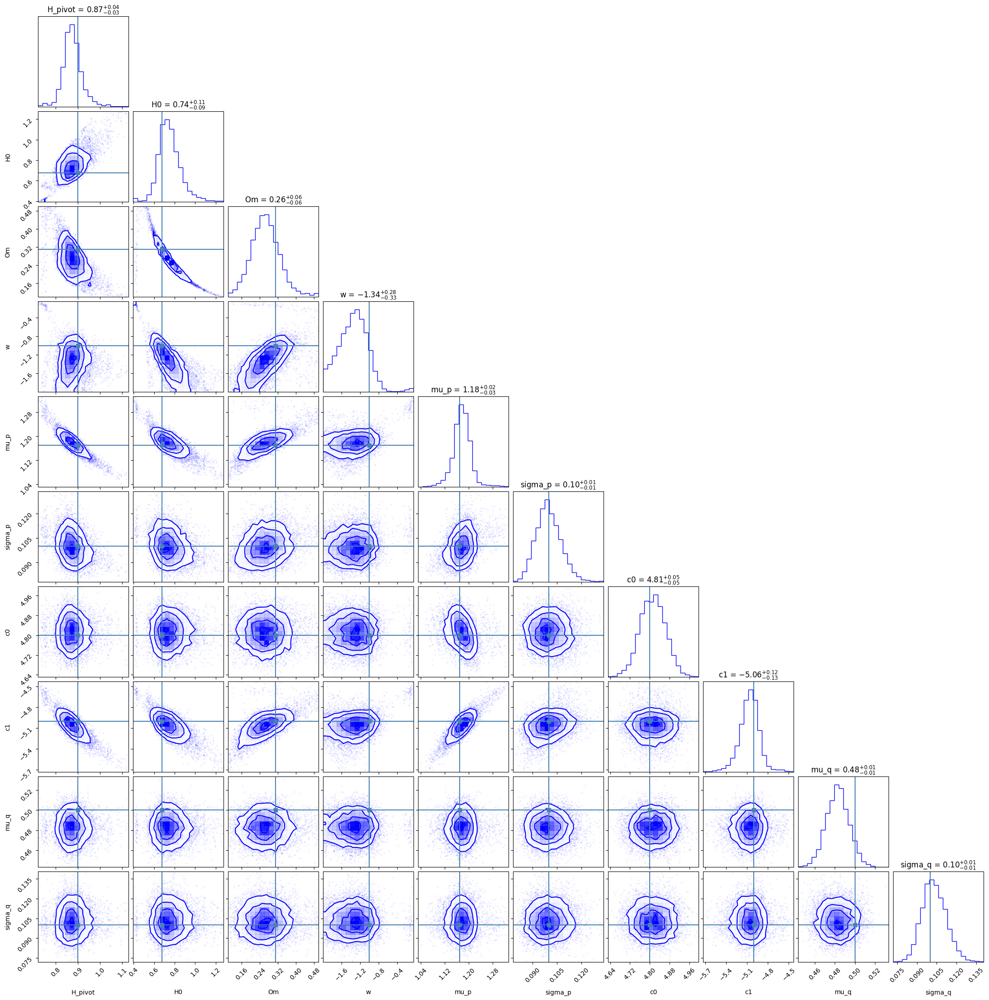

In [ ]:
import corner

# Extract the relevant parameters from the traces
trace_data = trace.posterior.stack(samples=("chain", "draw"))[["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"]].to_array().values.T

# Define the labels and true values for the parameters
labels = ["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1","mu_q","sigma_q"]
true_values = [cosmo.H(z_pivot).value/100,cosmo.H0.value/100, cosmo.Om0, -1.0, 1.17, 0.1, 4.8, -5.0, 0.5, 0.1]

# Create the corner plot
figure = corner.corner(trace_data, labels=labels, show_titles=True, color="blue", hist_kwargs={"density": True}, truths=true_values)

plt.show()

In [ ]:
# Save the trace to the Colab environment
az.to_netcdf(trace, "Nobs100_10_02_inference_data_muq_sigmaq_4k4k_95ta.nc")
print("Trace saved to Colab session storage: Nobs100_10_02_inference_data_muq_sigmaq_4k4k_95ta.nc")

Trace saved to Colab session storage: Nobs100_10_02_inference_data_muq_sigmaq_4k4k_95ta.nc


In [ ]:
from google.colab import files

files.download("Nobs100_10_02_inference_data_muq_sigmaq_4k4k_95ta.nc")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using optimal z_pivot = 0.7376375290271473


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H_pivot  1.057  0.067   0.942    1.189      0.009    0.005      60.0   
H0       0.678  0.123   0.491    0.923      0.014    0.008      73.0   
Om       0.304  0.092   0.149    0.481      0.009    0.002     100.0   
w       -0.945  0.497  -1.884   -0.220      0.017    0.007     713.0   
mu_p     1.169  0.040   1.094    1.240      0.006    0.003      47.0   
sigma_p  0.103  0.009   0.087    0.119      0.001    0.000     264.0   
c0       4.753  0.232   4.331    5.163      0.036    0.019      44.0   
c1      -4.945  0.205  -5.329   -4.579      0.024    0.013      73.0   
mu_q     0.514  0.011   0.494    0.536      0.000    0.000    1854.0   
sigma_q  0.100  0.008   0.086    0.115      0.000    0.000    5243.0   

         ess_tail  r_hat  
H_pivot     138.0   1.02  
H0          230.0   1.02  
Om          455.0   1.02  
w           743.0   1.00  
mu_p        103.0   1.03  
sigma_p     839.0   1.01  
c0           88.0 

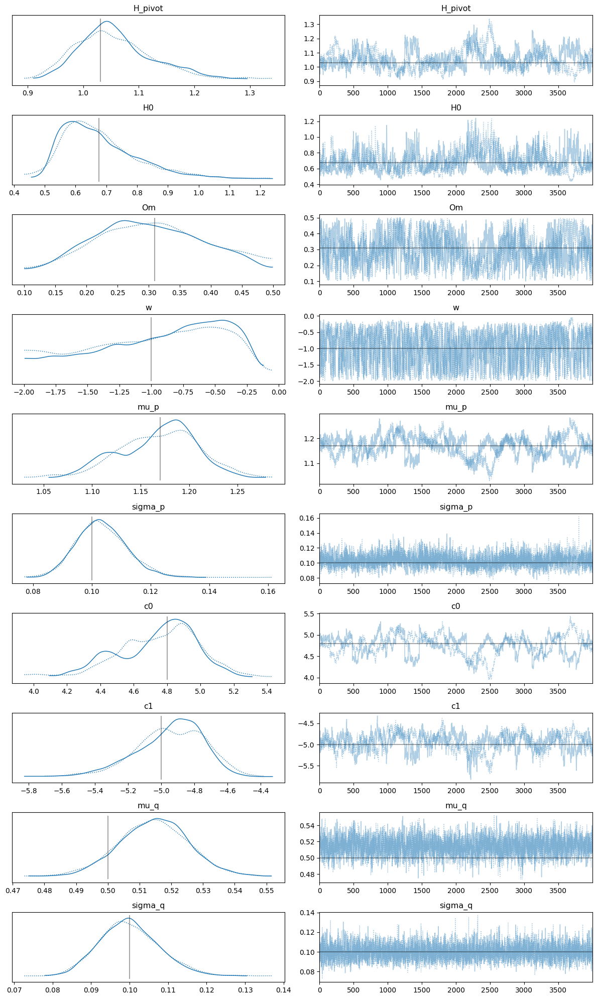

In [ ]:
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u

# --- Functions ---
def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om * opz ** (3 * (1 + wDM)) + (1 - Om) * opz ** (3 * (1 + w)))

def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

# --- Pivot optimization helper ---
def fracHz(z, Om=0.3, w=-1.0):
    """Proxy for fractional uncertainty σH/H from log-derivatives wrt parameters."""
    opz = 1 + z
    denom = Om + (1 - Om) * opz ** (3*w)
    num_Om = 1 - opz ** (3*w)
    num_w  = (1 - Om) * 3 * opz ** (3*w) * np.log(opz)
    return np.sqrt(num_Om**2 + num_w**2) / (2 * denom)

# --- Mock data ---
Nobs = 100
z_true = np.random.beta(3, 9, Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Gpc).value
sigma_DL = 0.07
DL_obs = np.random.normal(DL_true, sigma_DL)

# True chirp mass distribution
mu_p_true = 1.17
sigma_p_true = 0.1
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true

# --- Mass ratio (q) ---
mu_q_true = 0.5
sigma_q_true = 0.1
# Generate in [0,1]
q_true = np.clip(np.random.normal(mu_q_true, sigma_q_true, size=Nobs), 1e-4, 1-1e-4)

# Measurement noise
sigma_q_obs = 0.05
q_obs = np.clip(np.random.normal(q_true, sigma_q_obs), 1e-4, 1-1e-4)

m1_true = M_source_true * (1 + q_true) ** (1/5) / q_true ** (3/5)
m2_true = M_source_true * (1 + q_true) ** (1/5) * q_true ** (2/5)

# --- Tidal deformabilities ---
c0_true = 4.8
c1_true = -5.0
Lambda1_true = c0_true + c1_true * (m1_true - 1.4)
Lambda2_true = c0_true + c1_true * (m2_true - 1.4)

Lambda_til_true = (16.0 / 13.0) * (
    (m1_true + 12 * m2_true) * m1_true**4 * Lambda1_true
    + (m2_true + 12 * m1_true) * m2_true**4 * Lambda2_true
) / (m1_true + m2_true) ** 5
sigma_lambda = 0.07
Lambda_obs = np.random.normal(Lambda_til_true, sigma_lambda)

# Observed detector-frame chirp masses
Mz_obs = Mz_true

zinterp = np.linspace(0, 10, 1000)

# --- Choose pivot redshift (mathematically optimal) ---
z_grid = z_true
frac_vals = fracHz(z_grid)
z_pivot = float(z_grid[np.argmin(frac_vals)])
print("Using optimal z_pivot =", z_pivot)

# --- Model ---
with pm.Model() as model:

    # --- Cosmology priors with pivot parameterization ---
    H_pivot = pm.Uniform("H_pivot", 0.01, 3.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.01)
    wDM = 0.0

    # H0 defined from pivot: H(z_pivot) = H0 * Ez(z_pivot)
    z_piv_t = pt.as_tensor(z_pivot)
    H0 = pm.Deterministic("H0", H_pivot / Ez(z_piv_t, Om, w, wDM))
    dH = pm.Deterministic("dH", 2.99792 / H0)  # Gpc

    # --- Mass distribution ---
    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    # --- Mass ratio population hyper-parameters ---
    mu_q = pm.Uniform("mu_q", 0.01, 0.99)
    sigma_q = pm.Uniform("sigma_q", 0.0, 0.5)

    # --- Lambda relation ---
    c0 = pm.Uniform("c0", 3.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    # Latent redshifts
    z_unit = pm.Beta("z_unit", 3, 9, shape=Nobs)
    z = pm.Deterministic("z", z_unit * 10)

    # Distances
    dCinterp = dH * dCs(zinterp, Om, w, wDM)
    dLinterp = dLs(zinterp, dCinterp)
    dL = pm.Deterministic("dL", pt_interp(z, zinterp, dLinterp))

    # Masses in source frame
    Mc = pm.Deterministic("Mc", Mz_obs / (1 + z))

    # Latent q with hierarchical prior
    q = pm.TruncatedNormal("q", mu=mu_q, sigma=sigma_q,
                                  lower=0.0, upper=1.0, shape=Nobs)

    # Likelihood for observed noisy q
    pm.Normal("q_likelihood", mu=q, sigma=sigma_q_obs, observed=q_obs)

    m1 = pm.Deterministic("m1", Mc * (1 + q) ** (1/5) / q ** (3/5))
    m2 = pm.Deterministic("m2", Mc * (1 + q) ** (1/5) * q ** (2/5))

    # --- Lambda for each component ---
    Lambda1 = pm.Deterministic("Lambda1", c0 + c1 * (m1 - 1.4))
    Lambda2 = pm.Deterministic("Lambda2", c0 + c1 * (m2 - 1.4))

    # --- Tilde Lambda (mass-weighted combination) ---
    Lambda_til = pm.Deterministic("Lambda_til",(16.0 / 13.0)*((m1 + 12 * m2) * m1**4 * Lambda1 + (m2 + 12 * m1) * m2**4 * Lambda2)/(m1 + m2) ** 5)

    # Likelihoods & priors
    pm.Potential("mcprior", pt.sum(pm.logp(pm.Normal.dist(mu_p, sigma_p), Mc)))
    pm.Potential("mcjac", pt.sum(-pt.log1p(z)))
    pm.Normal("dL_likelihood", mu=dL, sigma=sigma_DL, observed=DL_obs)
    pm.Normal("Lambda_til_likelihood", mu=Lambda_til, sigma=sigma_lambda, observed=Lambda_obs)



    # Initial values
    initvals = {
        "H_pivot": cosmo.H(z_pivot).value / 100,
        "Om": cosmo.Om0,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
        "mu_q": 0.5,
        "sigma_q": 0.1,
    }

    # Sampling
    trace = pm.sample(4000, tune=4000, target_accept=0.95, initvals=initvals, max_treedepth=15)


summary = az.summary(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"])
print(summary)


# Traces
az.plot_trace(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"],
              lines=[('H_pivot', {}, cosmo.H(z_pivot).value/100),
                     ('H0', {}, cosmo.H0.value/100),
                     ('Om', {}, cosmo.Om0),
                     ('w', {}, -1),
                     ('mu_p', {}, 1.17),
                     ('sigma_p', {}, 0.1),
                     ('c0', {}, 4.8),
                     ('c1', {}, -5.0),
                     ('mu_q', {}, 0.5),
                     ('sigma_q', {}, 0.1)])
plt.tight_layout()
plt.show()

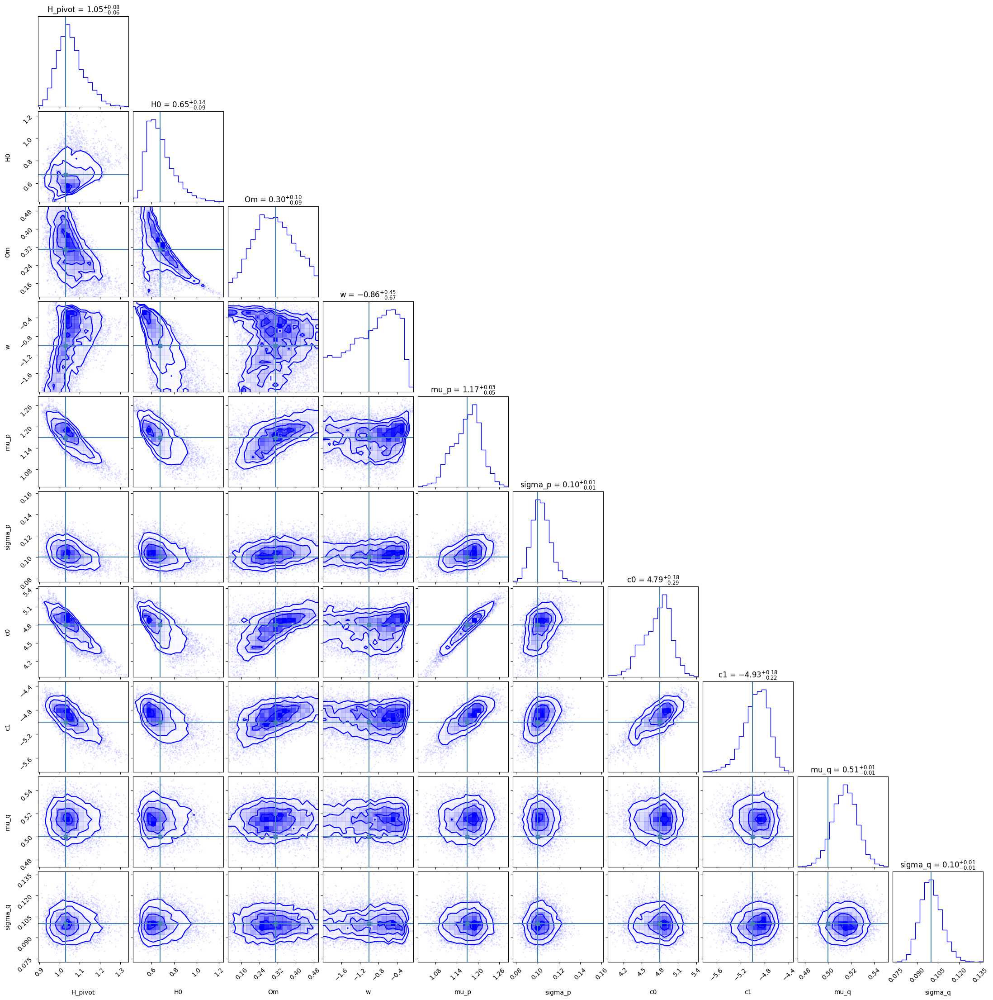

In [ ]:
import corner

# Extract the relevant parameters from the traces
trace_data = trace.posterior.stack(samples=("chain", "draw"))[["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"]].to_array().values.T

# Define the labels and true values for the parameters
labels = ["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1","mu_q","sigma_q"]
true_values = [cosmo.H(z_pivot).value/100,cosmo.H0.value/100, cosmo.Om0, -1.0, 1.17, 0.1, 4.8, -5.0, 0.5, 0.1]

# Create the corner plot
figure = corner.corner(trace_data, labels=labels, show_titles=True, color="blue", hist_kwargs={"density": True}, truths=true_values)

plt.show()

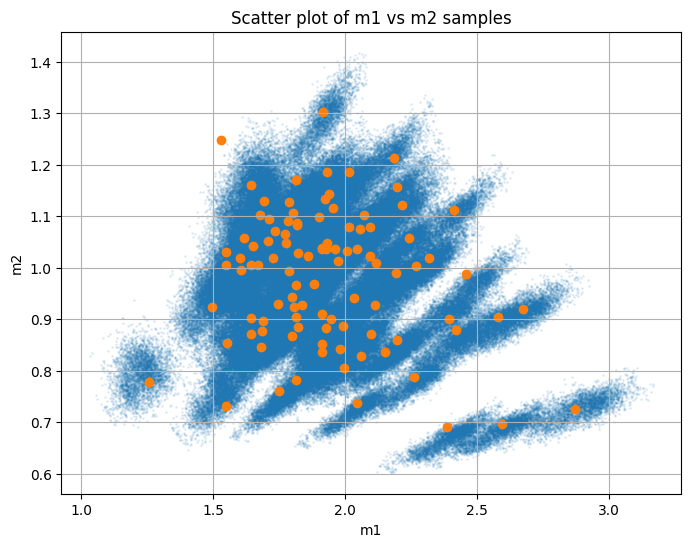

In [ ]:
# Extract m1 and m2 from the trace
m1_samples = trace.posterior["m1"].stack(samples=("chain", "draw")).values
m2_samples = trace.posterior["m2"].stack(samples=("chain", "draw")).values

# Since m1 and m2 are arrays for each observation, we can plot the relationship for a subset of samples
# Let's take a random subset of samples to visualize
num_samples_to_plot = 4000
random_indices = np.random.choice(m1_samples.shape[1], num_samples_to_plot, replace=False)

plt.figure(figsize=(8, 6))
plt.scatter(m1_samples[:, random_indices], m2_samples[:, random_indices], alpha=0.1, s=1)
plt.scatter(m1_true,m2_true)
plt.xlabel("m1")
plt.ylabel("m2")
plt.title("Scatter plot of m1 vs m2 samples")
plt.grid(True)
plt.show()
## try seeing in m1=m2 line

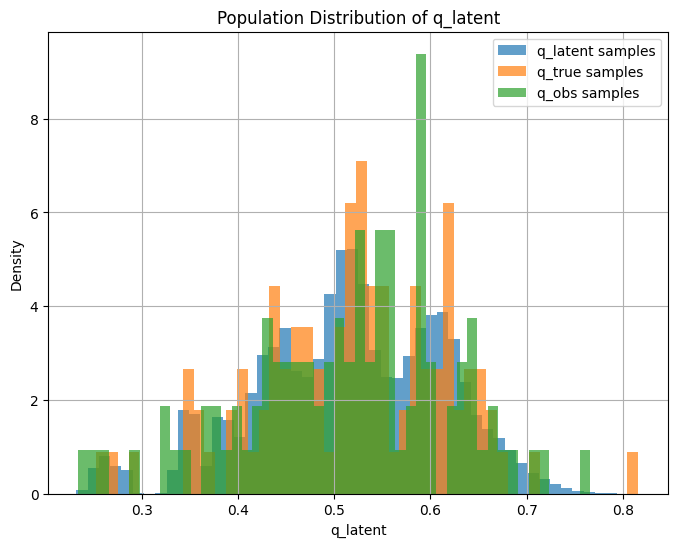

In [ ]:
# Extract q_latent from the trace and flatten the samples
q_latent_samples = trace.posterior["q"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(q_latent_samples, bins=50, density=True, alpha=0.7, label="q_latent samples")
plt.hist(q_true, bins=50, density=True, alpha=0.7, label="q_true samples")
plt.hist(q_obs, bins=50, density=True, alpha=0.7, label="q_obs samples")
plt.xlabel("q_latent")
plt.ylabel("Density")
plt.title("Population Distribution of q_latent")
plt.legend()
plt.grid(True)
plt.show()

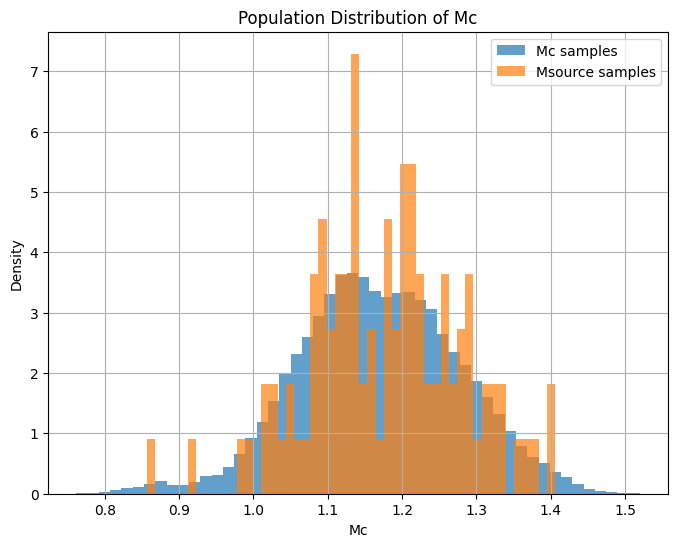

In [ ]:
# Extract q_latent from the trace and flatten the samples
Mc_samples = trace.posterior["Mc"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(Mc_samples, bins=50, density=True, alpha=0.7, label="Mc samples")
plt.hist(M_source_true, bins=50, density=True, alpha=0.7, label="Msource samples")
plt.xlabel("Mc")
plt.ylabel("Density")
plt.title("Population Distribution of Mc")
plt.legend()
plt.grid(True)
plt.show()

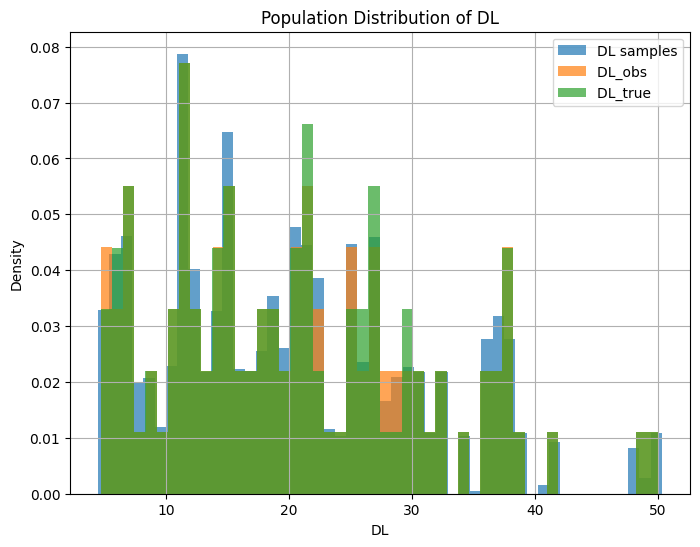

In [ ]:
# Extract q_latent from the trace and flatten the samples
DL_samples = trace.posterior["dL"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(DL_samples, bins=50, density=True, alpha=0.7, label="DL samples")
plt.hist(DL_obs, bins=50, density=True, alpha=0.7, label="DL_obs ")
plt.hist(DL_true, bins=50, density=True, alpha=0.7, label="DL_true ")
plt.xlabel("DL")
plt.ylabel("Density")
plt.title("Population Distribution of DL")
plt.legend()
plt.grid(True)
plt.show()

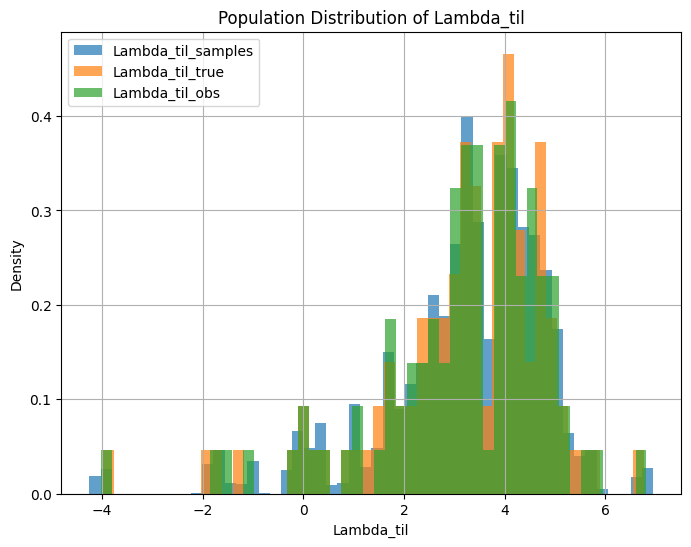

In [ ]:
# Extract q_latent from the trace and flatten the samples
Lambda_til_samples = trace.posterior["Lambda_til"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(Lambda_til_samples, bins=50, density=True, alpha=0.7, label="Lambda_til_samples")
plt.hist(Lambda_til_true, bins=50, density=True, alpha=0.7, label="Lambda_til_true")
plt.hist(Lambda_obs, bins=50, density=True, alpha=0.7, label="Lambda_til_obs")
plt.xlabel("Lambda_til")
plt.ylabel("Density")
plt.title("Population Distribution of Lambda_til")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Save the trace to the Colab environment
az.to_netcdf(trace, "Nobs100_10_03_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")
print("Trace saved to Colab session storage: Nobs100_10_03_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

Trace saved to Colab session storage: Nobs100_10_03_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc


In [ ]:
from google.colab import files

files.download("Nobs100_10_03_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using optimal z_pivot = 0.4834818150712632


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H_pivot  0.908  0.062   0.800    1.018      0.011    0.011      30.0   
H0       0.702  0.099   0.544    0.888      0.014    0.010      45.0   
Om       0.309  0.078   0.177    0.466      0.012    0.007      45.0   
w       -1.003  0.284  -1.493   -0.559      0.007    0.002    1830.0   
mu_p     1.157  0.035   1.093    1.220      0.006    0.006      31.0   
sigma_p  0.105  0.008   0.090    0.120      0.001    0.000     218.0   
c0       4.703  0.213   4.337    5.109      0.039    0.038      30.0   
c1      -5.175  0.213  -5.603   -4.818      0.034    0.016      38.0   
mu_q     0.505  0.012   0.482    0.527      0.000    0.000    1519.0   
sigma_q  0.110  0.009   0.094    0.127      0.000    0.000    4279.0   

         ess_tail  r_hat  
H_pivot      36.0   1.08  
H0          112.0   1.05  
Om          115.0   1.06  
w          3966.0   1.00  
mu_p         39.0   1.08  
sigma_p     761.0   1.01  
c0           39.0 

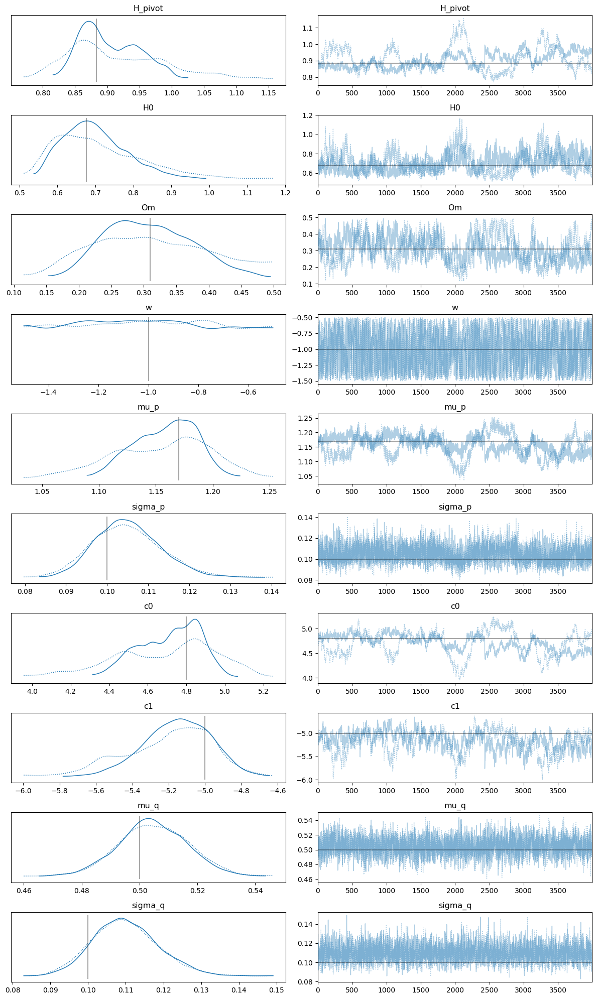

In [ ]:
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u

# --- Functions ---
def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om * opz ** (3 * (1 + wDM)) + (1 - Om) * opz ** (3 * (1 + w)))

def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

# --- Pivot optimization helper ---
def fracHz(z, Om=0.3, w=-1.0):
    """Proxy for fractional uncertainty σH/H from log-derivatives wrt parameters."""
    opz = 1 + z
    denom = Om + (1 - Om) * opz ** (3*w)
    num_Om = 1 - opz ** (3*w)
    num_w  = (1 - Om) * 3 * opz ** (3*w) * np.log(opz)
    return np.sqrt(num_Om**2 + num_w**2) / (2 * denom)

# --- Mock data ---
Nobs = 100
z_true = np.random.beta(3, 9, Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Gpc).value
sigma_DL = 0.07
DL_obs = np.random.normal(DL_true, sigma_DL)

# True chirp mass distribution
mu_p_true = 1.17
sigma_p_true = 0.1
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true

# --- Mass ratio (q) ---
mu_q_true = 0.5
sigma_q_true = 0.1
# Generate in [0,1]
q_true = np.clip(np.random.normal(mu_q_true, sigma_q_true, size=Nobs), 1e-4, 1-1e-4)

# Measurement noise
sigma_q_obs = 0.05
q_obs = np.clip(np.random.normal(q_true, sigma_q_obs), 1e-4, 1-1e-4)

m1_true = M_source_true * (1 + q_true) ** (1/5) / q_true ** (3/5)
m2_true = M_source_true * (1 + q_true) ** (1/5) * q_true ** (2/5)

# --- Tidal deformabilities ---
c0_true = 4.8
c1_true = -5.0
Lambda1_true = c0_true + c1_true * (m1_true - 1.4)
Lambda2_true = c0_true + c1_true * (m2_true - 1.4)

Lambda_til_true = (16.0 / 13.0) * (
    (m1_true + 12 * m2_true) * m1_true**4 * Lambda1_true
    + (m2_true + 12 * m1_true) * m2_true**4 * Lambda2_true
) / (m1_true + m2_true) ** 5
sigma_lambda = 0.07
Lambda_obs = np.random.normal(Lambda_til_true, sigma_lambda)

# Observed detector-frame chirp masses
Mz_obs = Mz_true

zinterp = np.linspace(0, 10, 1000)

# --- Choose pivot redshift (mathematically optimal) ---
z_grid = z_true
frac_vals = fracHz(z_grid)
z_pivot = float(z_grid[np.argmin(frac_vals)])
print("Using optimal z_pivot =", z_pivot)

# --- Model ---
with pm.Model() as model:

    # --- Cosmology priors with pivot parameterization ---
    H_pivot = pm.Uniform("H_pivot", 0.01, 2.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -1.5, -0.5)
    wDM = 0.0

    # H0 defined from pivot: H(z_pivot) = H0 * Ez(z_pivot)
    z_piv_t = pt.as_tensor(z_pivot)
    H0 = pm.Deterministic("H0", H_pivot / Ez(z_piv_t, Om, w, wDM))
    dH = pm.Deterministic("dH", 2.99792 / H0)  # Gpc

    # --- Mass distribution ---
    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    # --- Mass ratio population hyper-parameters ---
    mu_q = pm.Uniform("mu_q", 0.01, 0.99)
    sigma_q = pm.Uniform("sigma_q", 0.0, 0.5)

    # --- Lambda relation ---
    c0 = pm.Uniform("c0", 3.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    # Latent redshifts
    z_unit = pm.Beta("z_unit", 3, 9, shape=Nobs)
    z = pm.Deterministic("z", z_unit * 10)

    # Distances
    dCinterp = dH * dCs(zinterp, Om, w, wDM)
    dLinterp = dLs(zinterp, dCinterp)
    dL = pm.Deterministic("dL", pt_interp(z, zinterp, dLinterp))

    # Masses in source frame
    Mc = pm.Deterministic("Mc", Mz_obs / (1 + z))

    # Latent q with hierarchical prior
    q = pm.TruncatedNormal("q", mu=mu_q, sigma=sigma_q,
                                  lower=0.0, upper=1.0, shape=Nobs)

    # Likelihood for observed noisy q
    pm.Normal("q_likelihood", mu=q, sigma=sigma_q_obs, observed=q_obs)

    m1 = pm.Deterministic("m1", Mc * (1 + q) ** (1/5) / q ** (3/5))
    m2 = pm.Deterministic("m2", Mc * (1 + q) ** (1/5) * q ** (2/5))

    # --- Lambda for each component ---
    Lambda1 = pm.Deterministic("Lambda1", c0 + c1 * (m1 - 1.4))
    Lambda2 = pm.Deterministic("Lambda2", c0 + c1 * (m2 - 1.4))

    # --- Tilde Lambda (mass-weighted combination) ---
    Lambda_til = pm.Deterministic("Lambda_til",(16.0 / 13.0)*((m1 + 12 * m2) * m1**4 * Lambda1 + (m2 + 12 * m1) * m2**4 * Lambda2)/(m1 + m2) ** 5)

    # Likelihoods & priors
    pm.Potential("mcprior", pt.sum(pm.logp(pm.Normal.dist(mu_p, sigma_p), Mc)))
    pm.Potential("mcjac", pt.sum(-pt.log1p(z)))
    pm.Normal("dL_likelihood", mu=dL, sigma=sigma_DL, observed=DL_obs)
    pm.Normal("Lambda_til_likelihood", mu=Lambda_til, sigma=sigma_lambda, observed=Lambda_obs)



    # Initial values
    initvals = {
        "H_pivot": cosmo.H(z_pivot).value / 100,
        "Om": cosmo.Om0,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
        "mu_q": 0.5,
        "sigma_q": 0.1,
    }

    # Sampling
    trace = pm.sample(4000, tune=4000, target_accept=0.95, initvals=initvals, max_treedepth=15)


summary = az.summary(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"])
print(summary)


# Traces
az.plot_trace(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"],
              lines=[('H_pivot', {}, cosmo.H(z_pivot).value/100),
                     ('H0', {}, cosmo.H0.value/100),
                     ('Om', {}, cosmo.Om0),
                     ('w', {}, -1),
                     ('mu_p', {}, 1.17),
                     ('sigma_p', {}, 0.1),
                     ('c0', {}, 4.8),
                     ('c1', {}, -5.0),
                     ('mu_q', {}, 0.5),
                     ('sigma_q', {}, 0.1)])
plt.tight_layout()
plt.show()

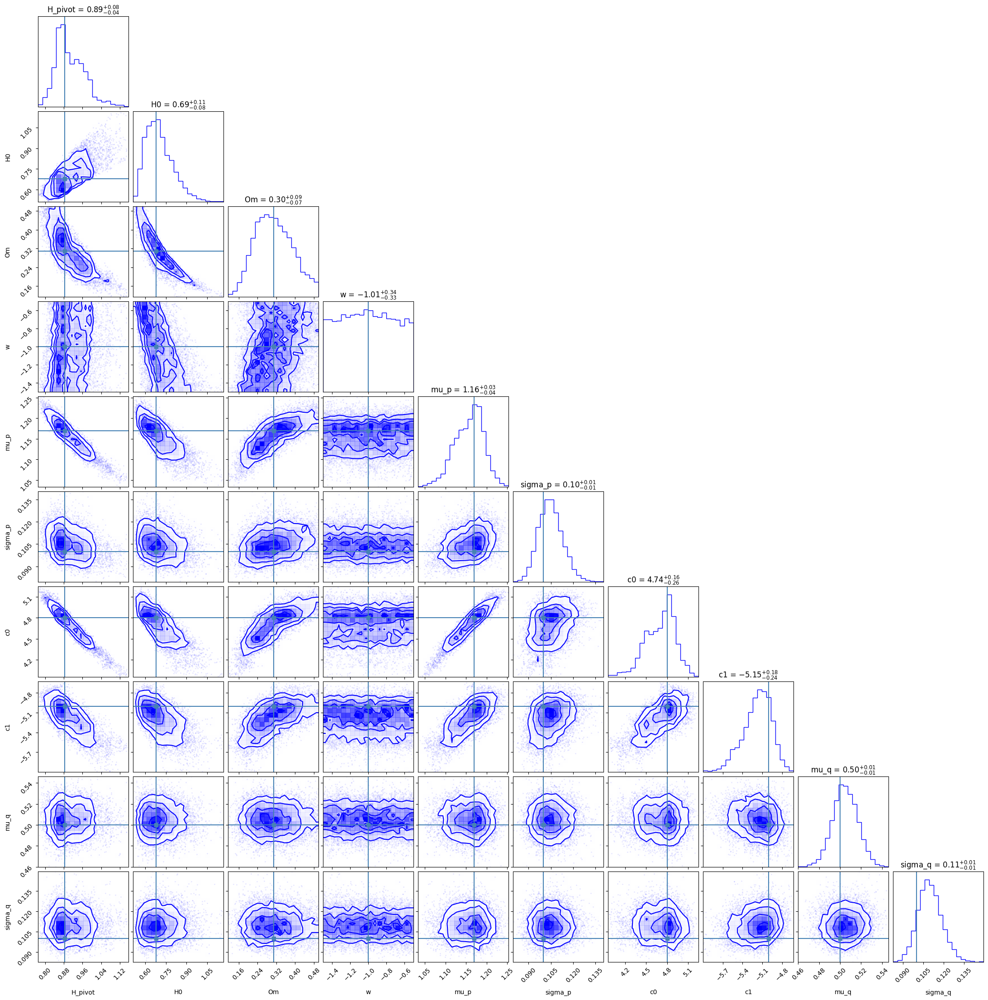

In [ ]:
import corner

# Extract the relevant parameters from the traces
trace_data = trace.posterior.stack(samples=("chain", "draw"))[["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"]].to_array().values.T

# Define the labels and true values for the parameters
labels = ["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1","mu_q","sigma_q"]
true_values = [cosmo.H(z_pivot).value/100,cosmo.H0.value/100, cosmo.Om0, -1.0, 1.17, 0.1, 4.8, -5.0, 0.5, 0.1]

# Create the corner plot
figure = corner.corner(trace_data, labels=labels, show_titles=True, color="blue", hist_kwargs={"density": True}, truths=true_values)

plt.show()

In [ ]:
# Save the trace to the Colab environment
az.to_netcdf(trace, "Nobs100_10_11_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")
print("Trace saved to Colab session storage: Nobs100_10_11_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

Trace saved to Colab session storage: Nobs100_10_11_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc


In [ ]:
from google.colab import files

files.download("Nobs100_10_11_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np

current_state = np.random.get_state()
current_seed = current_state[1][0]
print(f"Current random seed: {current_seed}")

Current random seed: 2104189635


In [ ]:
np.random.seed(2104189635)

Using optimal z_pivot = 0.12603855106464928


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
H_pivot  0.894  0.038   0.832    0.969      0.017    0.008       6.0   
H0       0.881  0.057   0.783    0.989      0.023    0.010       7.0   
Om       0.187  0.019   0.150    0.220      0.007    0.002       7.0   
w       -1.163  0.148  -1.447   -0.907      0.030    0.006      25.0   
mu_p     1.116  0.007   1.101    1.127      0.004    0.002       5.0   
sigma_p  0.093  0.002   0.089    0.097      0.000    0.000      45.0   
c0       5.931  0.026   5.883    5.979      0.002    0.001     240.0   
c1      -5.268  0.059  -5.366   -5.141      0.021    0.008       9.0   
mu_q     0.506  0.004   0.499    0.513      0.000    0.000     489.0   
sigma_q  0.102  0.002   0.097    0.106      0.000    0.000    1802.0   

         ess_tail  r_hat  
H_pivot      20.0   1.28  
H0           28.0   1.23  
Om           29.0   1.21  
w           277.0   1.09  
mu_p         12.0   1.36  
sigma_p    1422.0   1.03  
c0          924.0 

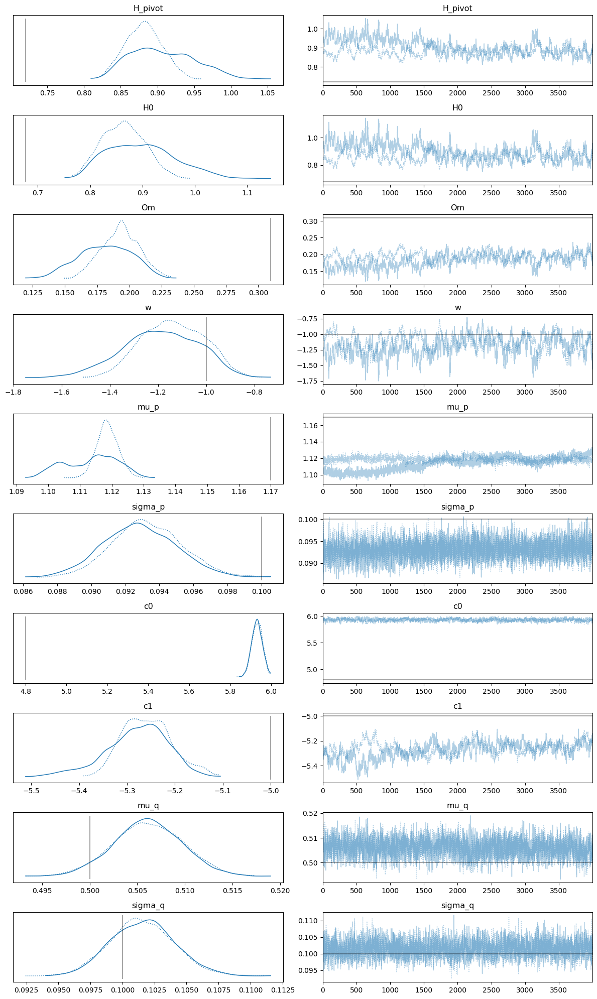

In [ ]:
import pymc as pm
import pytensor.tensor as pt
import pytensor.tensor.extra_ops as pte
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
from astropy.cosmology import Planck18 as cosmo
from astropy import units as u

# --- Functions ---
def Ez(z, Om, w, wDM):
    opz = 1 + z
    return pt.sqrt(Om * opz ** (3 * (1 + wDM)) + (1 - Om) * opz ** (3 * (1 + w)))

def dCs(zs, Om, w, wDM):
    dz = zs[1:] - zs[:-1]
    fz = 1 / Ez(zs, Om, w, wDM)
    I = 0.5 * dz * (fz[:-1] + fz[1:])
    return pt.concatenate([pt.as_tensor([0.0]), pt.cumsum(I)])

def dLs(zs, dCs):
    return dCs * (1 + zs)

def pt_interp(x, xs, ys):
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)
    ind = pte.searchsorted(xs, x)
    ind = pt.clip(ind, 1, xs.shape[0] - 1)
    r = (x - xs[ind - 1]) / (xs[ind] - xs[ind - 1])
    return r * ys[ind] + (1 - r) * ys[ind - 1]

# --- Pivot optimization helper ---
def fracHz(z, Om=0.3, w=-1.0):
    """Proxy for fractional uncertainty σH/H from log-derivatives wrt parameters."""
    opz = 1 + z
    denom = Om + (1 - Om) * opz ** (3*w)
    num_Om = 1 - opz ** (3*w)
    num_w  = (1 - Om) * 3 * opz ** (3*w) * np.log(opz)
    return np.sqrt(num_Om**2 + num_w**2) / (2 * denom)

# --- Mock data ---
Nobs = 1000
z_true = np.random.beta(3, 9, Nobs) * 10
DL_true = cosmo.luminosity_distance(z_true).to(u.Gpc).value
sigma_DL = 0.07
DL_obs = np.random.normal(DL_true, sigma_DL)

# True chirp mass distribution
mu_p_true = 1.17
sigma_p_true = 0.1
M_source_true = np.random.normal(mu_p_true, sigma_p_true, size=Nobs)
Mz_true = (1 + z_true) * M_source_true

# --- Mass ratio (q) ---
mu_q_true = 0.5
sigma_q_true = 0.1
# Generate in [0,1]
q_true = np.clip(np.random.normal(mu_q_true, sigma_q_true, size=Nobs), 1e-4, 1-1e-4)

# Measurement noise
sigma_q_obs = 0.05
q_obs = np.clip(np.random.normal(q_true, sigma_q_obs), 1e-4, 1-1e-4)

m1_true = M_source_true * (1 + q_true) ** (1/5) / q_true ** (3/5)
m2_true = M_source_true * (1 + q_true) ** (1/5) * q_true ** (2/5)

# --- Tidal deformabilities ---
c0_true = 4.8
c1_true = -5.0
Lambda1_true = c0_true + c1_true * (m1_true - 1.4)
Lambda2_true = c0_true + c1_true * (m2_true - 1.4)

Lambda_til_true = (16.0 / 13.0) * (
    (m1_true + 12 * m2_true) * m1_true**4 * Lambda1_true
    + (m2_true + 12 * m1_true) * m2_true**4 * Lambda2_true
) / (m1_true + m2_true) ** 5
sigma_lambda = 0.07
Lambda_obs = np.random.normal(Lambda_til_true, sigma_lambda)

# Observed detector-frame chirp masses
Mz_obs = Mz_true

zinterp = np.linspace(0, 10, 1000)

# --- Choose pivot redshift (mathematically optimal) ---
z_grid = z_true
frac_vals = fracHz(z_grid)
z_pivot = float(z_grid[np.argmin(frac_vals)])
print("Using optimal z_pivot =", z_pivot)

# --- Model ---
with pm.Model() as model:

    # --- Cosmology priors with pivot parameterization ---
    H_pivot = pm.Uniform("H_pivot", 0.01, 2.0)
    Om = pm.Uniform("Om", 0.1, 0.5)
    w = pm.Uniform("w", -2.0, -0.0)
    wDM = 0.0

    # H0 defined from pivot: H(z_pivot) = H0 * Ez(z_pivot)
    z_piv_t = pt.as_tensor(z_pivot)
    H0 = pm.Deterministic("H0", H_pivot / Ez(z_piv_t, Om, w, wDM))
    dH = pm.Deterministic("dH", 2.99792 / H0)  # Gpc

    # --- Mass distribution ---
    mu_p = pm.Uniform("mu_p", 0.5, 2.0)
    sigma_p = pm.Uniform("sigma_p", 0.0, 0.5)

    # --- Mass ratio population hyper-parameters ---
    mu_q = pm.Uniform("mu_q", 0.01, 0.99)
    sigma_q = pm.Uniform("sigma_q", 0.0, 0.5)

    # --- Lambda relation ---
    c0 = pm.Uniform("c0", 3.0, 6.0)
    c1 = pm.Uniform("c1", -7.0, -3.0)

    # Latent redshifts
    z_unit = pm.Beta("z_unit", 3, 9, shape=Nobs)
    z = pm.Deterministic("z", z_unit * 10)

    # Distances
    dCinterp = dH * dCs(zinterp, Om, w, wDM)
    dLinterp = dLs(zinterp, dCinterp)
    dL = pm.Deterministic("dL", pt_interp(z, zinterp, dLinterp))

    # Masses in source frame
    Mc = pm.Deterministic("Mc", Mz_obs / (1 + z))

    # Latent q with hierarchical prior
    q = pm.TruncatedNormal("q", mu=mu_q, sigma=sigma_q,
                                  lower=0.0, upper=1.0, shape=Nobs)

    # Likelihood for observed noisy q
    pm.Normal("q_likelihood", mu=q, sigma=sigma_q_obs, observed=q_obs)

    m1 = pm.Deterministic("m1", Mc * (1 + q) ** (1/5) / q ** (3/5))
    m2 = pm.Deterministic("m2", Mc * (1 + q) ** (1/5) * q ** (2/5))

    # --- Lambda for each component ---
    Lambda1 = pm.Deterministic("Lambda1", c0 + c1 * (m1 - mu_p))
    Lambda2 = pm.Deterministic("Lambda2", c0 + c1 * (m2 - mu_p))

    # --- Tilde Lambda (mass-weighted combination) ---
    Lambda_til = pm.Deterministic("Lambda_til",(16.0 / 13.0)*((m1 + 12 * m2) * m1**4 * Lambda1 + (m2 + 12 * m1) * m2**4 * Lambda2)/(m1 + m2) ** 5)

    # Likelihoods & priors
    pm.Potential("mcprior", pt.sum(pm.logp(pm.Normal.dist(mu_p, sigma_p), Mc)))
    pm.Potential("mcjac", pt.sum(-pt.log1p(z)))
    pm.Normal("dL_likelihood", mu=dL, sigma=sigma_DL, observed=DL_obs)
    pm.Normal("Lambda_til_likelihood", mu=Lambda_til, sigma=sigma_lambda, observed=Lambda_obs)



    # Initial values
    initvals = {
        "H_pivot": cosmo.H(z_pivot).value / 100,
        "Om": cosmo.Om0,
        "w": -1.0,
        "mu_p": 1.17,
        "sigma_p": 0.1,
        "c0": 4.8,
        "c1": -5.0,
        "mu_q": 0.5,
        "sigma_q": 0.1,
    }

    # Sampling
    trace = pm.sample(4000, tune=4000, target_accept=0.95, initvals=initvals, max_treedepth=15)


summary = az.summary(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"])
print(summary)


# Traces
az.plot_trace(trace, var_names=["H_pivot", "H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"],
              lines=[('H_pivot', {}, cosmo.H(z_pivot).value/100),
                     ('H0', {}, cosmo.H0.value/100),
                     ('Om', {}, cosmo.Om0),
                     ('w', {}, -1),
                     ('mu_p', {}, 1.17),
                     ('sigma_p', {}, 0.1),
                     ('c0', {}, 4.8),
                     ('c1', {}, -5.0),
                     ('mu_q', {}, 0.5),
                     ('sigma_q', {}, 0.1)])
plt.tight_layout()
plt.show()

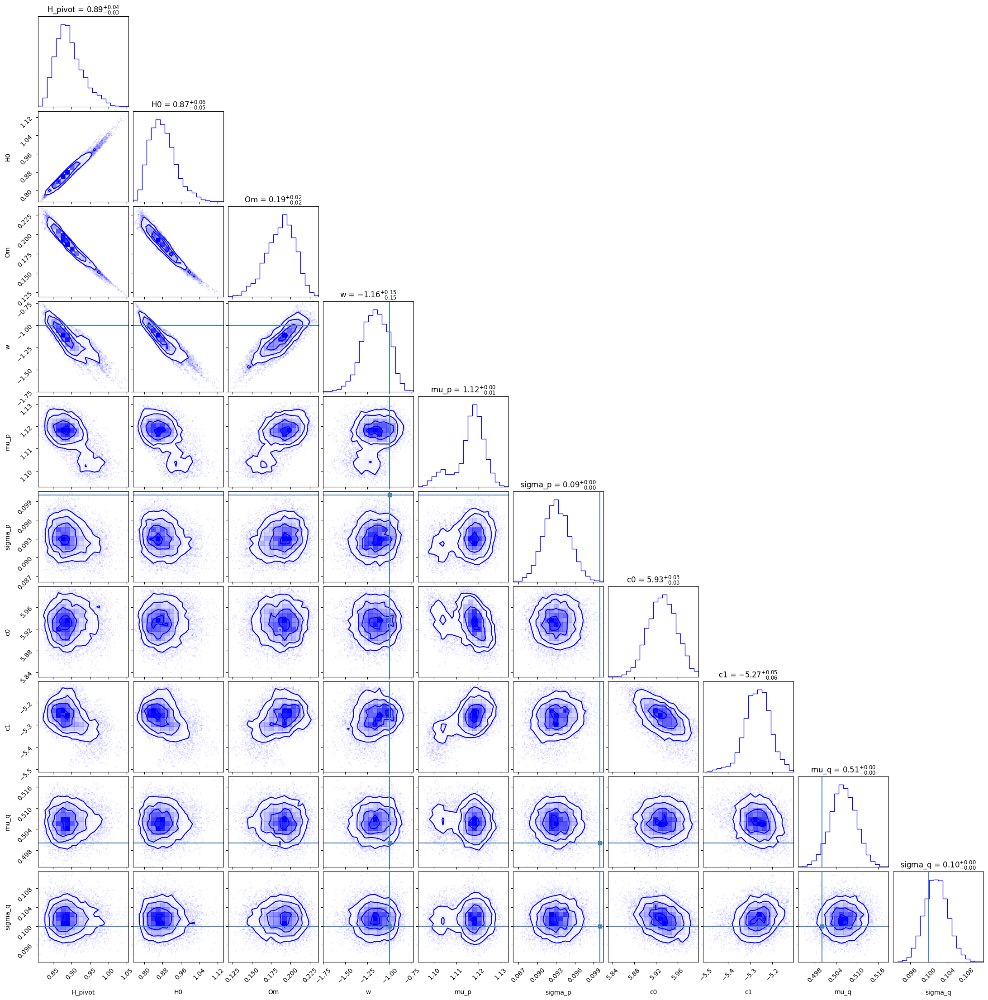

In [ ]:
import corner

# Extract the relevant parameters from the traces
trace_data = trace.posterior.stack(samples=("chain", "draw"))[["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1", "mu_q", "sigma_q"]].to_array().values.T

# Define the labels and true values for the parameters
labels = ["H_pivot","H0", "Om", "w", "mu_p", "sigma_p", "c0", "c1","mu_q","sigma_q"]
true_values = [cosmo.H(z_pivot).value/100,cosmo.H0.value/100, cosmo.Om0, -1.0, 1.17, 0.1, 4.8, -5.0, 0.5, 0.1]

# Create the corner plot
figure = corner.corner(trace_data, labels=labels, show_titles=True, color="blue", hist_kwargs={"density": True}, truths=true_values)

plt.show()

In [ ]:
# Save the trace to the Colab environment
az.to_netcdf(trace, "Nobs1000_10_19_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")
print("Trace saved to Colab session storage: Nobs1000_10_19_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

Trace saved to Colab session storage: Nobs1000_10_15_inference_data_muq_sigmaq_lambtil_dep_2k2k_95ta.nc


In [ ]:
from google.colab import files

files.download("Nobs1000_10_19_inference_data_muq_sigmaq_lambtil_dep_4k4k_95ta.nc")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

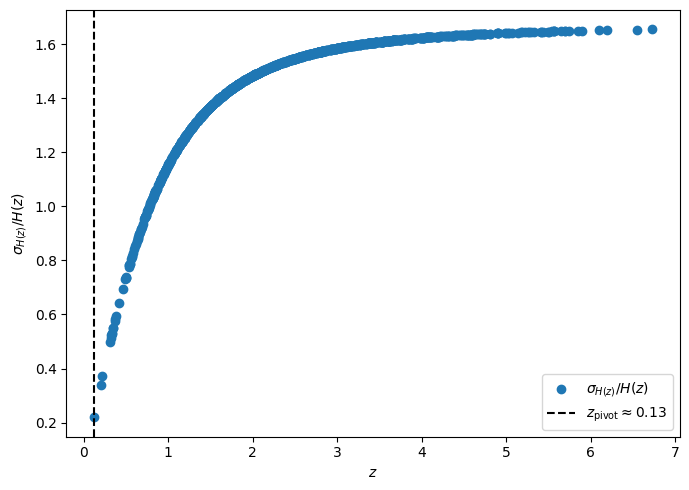

In [ ]:
plt.figure(figsize=(7,5))
plt.scatter(z_grid, frac_vals, label=r'$\sigma_{H(z)}/H(z)$')
plt.axvline(z_pivot, color='k', ls='--', label=fr'$z_\mathrm{{pivot}} \approx {z_pivot:.2f}$')
plt.xlabel(r"$z$")
plt.ylabel(r"$\sigma_{H(z)}/H(z)$")
plt.legend()
plt.tight_layout()
plt.show()

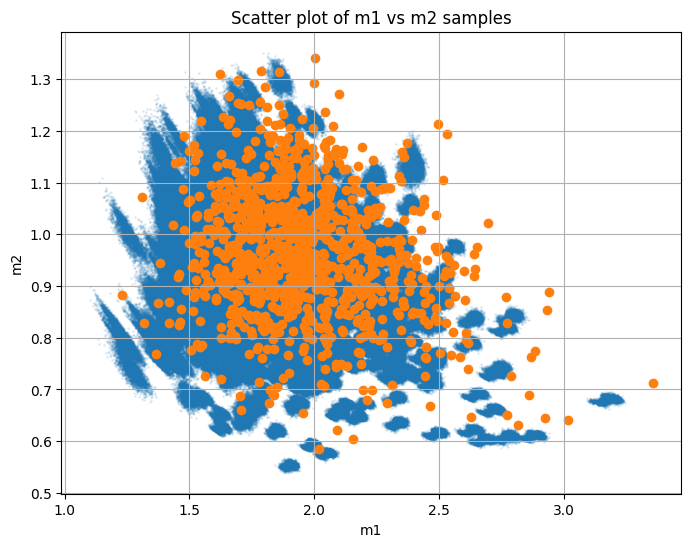

In [ ]:
# Extract m1 and m2 from the trace
m1_samples = trace.posterior["m1"].stack(samples=("chain", "draw")).values
m2_samples = trace.posterior["m2"].stack(samples=("chain", "draw")).values

# Since m1 and m2 are arrays for each observation, we can plot the relationship for a subset of samples
# Let's take a random subset of samples to visualize
num_samples_to_plot = 4000
random_indices = np.random.choice(m1_samples.shape[1], num_samples_to_plot, replace=False)

plt.figure(figsize=(8, 6))
plt.scatter(m1_samples[:, random_indices], m2_samples[:, random_indices], alpha=0.1, s=1)
plt.scatter(m1_true,m2_true)
plt.xlabel("m1")
plt.ylabel("m2")
plt.title("Scatter plot of m1 vs m2 samples")
plt.grid(True)
plt.show()
## try seeing in m1=m2 line

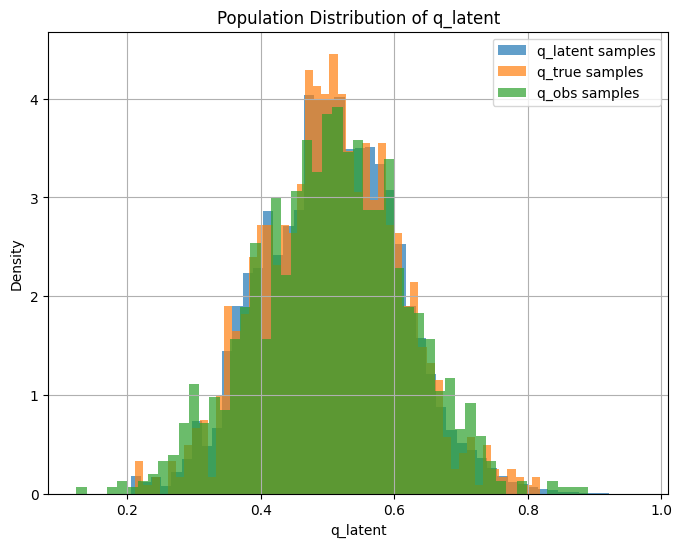

In [ ]:
# Extract q_latent from the trace and flatten the samples
q_latent_samples = trace.posterior["q"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(q_latent_samples, bins=50, density=True, alpha=0.7, label="q_latent samples")
plt.hist(q_true, bins=50, density=True, alpha=0.7, label="q_true samples")
plt.hist(q_obs, bins=50, density=True, alpha=0.7, label="q_obs samples")
plt.xlabel("q_latent")
plt.ylabel("Density")
plt.title("Population Distribution of q_latent")
plt.legend()
plt.grid(True)
plt.show()

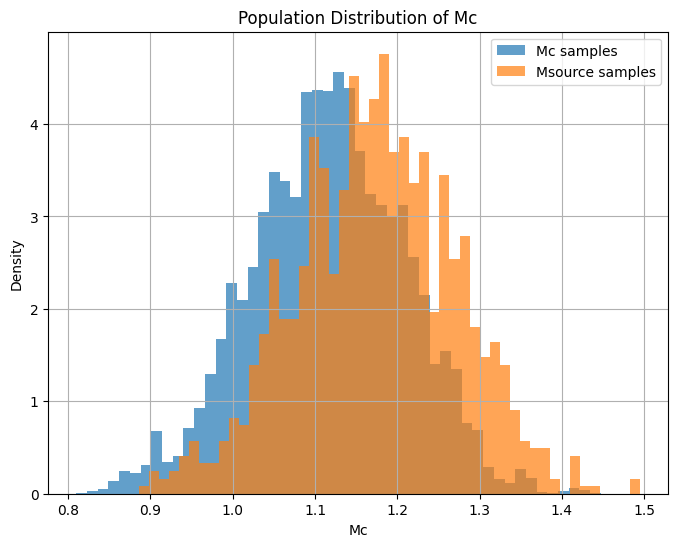

In [ ]:
# Extract q_latent from the trace and flatten the samples
Mc_samples = trace.posterior["Mc"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(Mc_samples, bins=50, density=True, alpha=0.7, label="Mc samples")
plt.hist(M_source_true, bins=50, density=True, alpha=0.7, label="Msource samples")
plt.xlabel("Mc")
plt.ylabel("Density")
plt.title("Population Distribution of Mc")
plt.legend()
plt.grid(True)
plt.show()

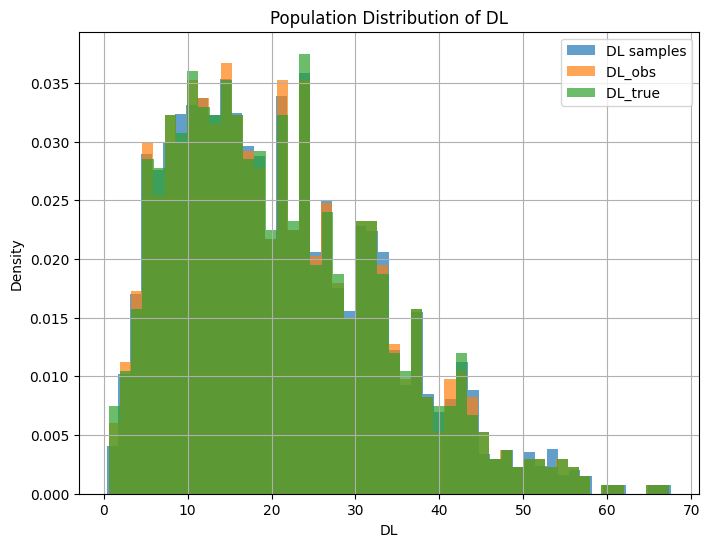

In [ ]:
# Extract q_latent from the trace and flatten the samples
DL_samples = trace.posterior["dL"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(DL_samples, bins=50, density=True, alpha=0.7, label="DL samples")
plt.hist(DL_obs, bins=50, density=True, alpha=0.7, label="DL_obs ")
plt.hist(DL_true, bins=50, density=True, alpha=0.7, label="DL_true ")
plt.xlabel("DL")
plt.ylabel("Density")
plt.title("Population Distribution of DL")
plt.legend()
plt.grid(True)
plt.show()

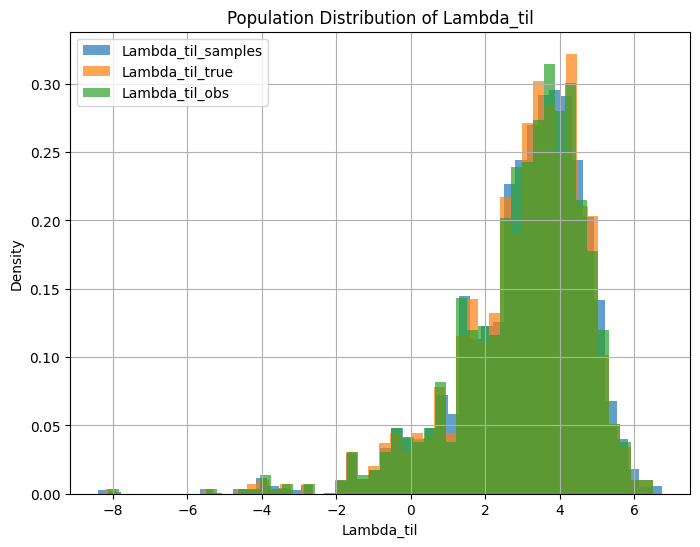

In [ ]:
# Extract q_latent from the trace and flatten the samples
Lambda_til_samples = trace.posterior["Lambda_til"].stack(samples=("chain", "draw")).values.flatten()

# Plot the histogram of q_latent samples
plt.figure(figsize=(8, 6))
plt.hist(Lambda_til_samples, bins=50, density=True, alpha=0.7, label="Lambda_til_samples")
plt.hist(Lambda_til_true, bins=50, density=True, alpha=0.7, label="Lambda_til_true")
plt.hist(Lambda_obs, bins=50, density=True, alpha=0.7, label="Lambda_til_obs")
plt.xlabel("Lambda_til")
plt.ylabel("Density")
plt.title("Population Distribution of Lambda_til")
plt.legend()
plt.grid(True)
plt.show()

### Need to find the correct formula for the tidal deformability.
### Need to check for informative posterior for w by increasing Nobs.